# ISE 535 Final Project
## Financial Analysis using Python and Machine Learning
### Piyush Biraje


###  PROJECT OVERVIEW


#### Motivation:

Owing to my interest in finance and investment, I started studying more about it and completed online courses. Quickly I realized that the analysis required to make more profitable investments would be convenient using Python. 


#### Objectives:

To build a porfolio of programs that will be used in  
●	Applying financial concepts: portfolio returns, risk, etc.   
●	Implementing certain trading strategies (momentum-based, moving average, etc.)  
●	Build Data visualization/ Business intelligence tools  

#### Tools and libraries used:

Neural Networks, unsupervised learning, NLP  
Pandas, NumPy, scipy, plotly, seaborn, sklearn



#### List of the stocks considered:

AAPL = Apple Stock  
BA = Boeing  
T = AT&T  
MGM = MGM Resorts International  
AMZN = Amazon  
IBM = IBM  
TSLA = Tesla Motors  
GOOG = Google   
sp500 = US Stock Market (S&P 500 is a stock market index that measures the stock performance of 500 large companies listed on U.S. stock exchange)


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from copy import copy
from scipy import stats
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

In [2]:

path = "https://raw.github.ncsu.edu/pbiraje/535-Financial-Analysis/master/stock.csv?token=AAAEICBFHNWEQN24Z5DAAB27XBUKI"

stocks_df = pd.read_csv(path)

# Sort the stock data by date
stocks_df = stocks_df.sort_values(by = ['Date'])
stocks_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


### EXPLORATORY DATA ANALYSIS AND INITIAL VISUALIZATION

In [3]:
# Check if data contains any null values
stocks_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [4]:
# Getting dataframe info
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2159 non-null   object 
 1   AAPL    2159 non-null   float64
 2   BA      2159 non-null   float64
 3   T       2159 non-null   float64
 4   MGM     2159 non-null   float64
 5   AMZN    2159 non-null   float64
 6   IBM     2159 non-null   float64
 7   TSLA    2159 non-null   float64
 8   GOOG    2159 non-null   float64
 9   sp500   2159 non-null   float64
dtypes: float64(9), object(1)
memory usage: 185.5+ KB


In [5]:
# Function to plot the entire dataframe
# input = dataframe df, title of the figure

def show_plot(df, fig_title):
    df.plot(x = 'Date', figsize = (15,7), linewidth = 3, title = fig_title)
    plt.grid()
    plt.show()

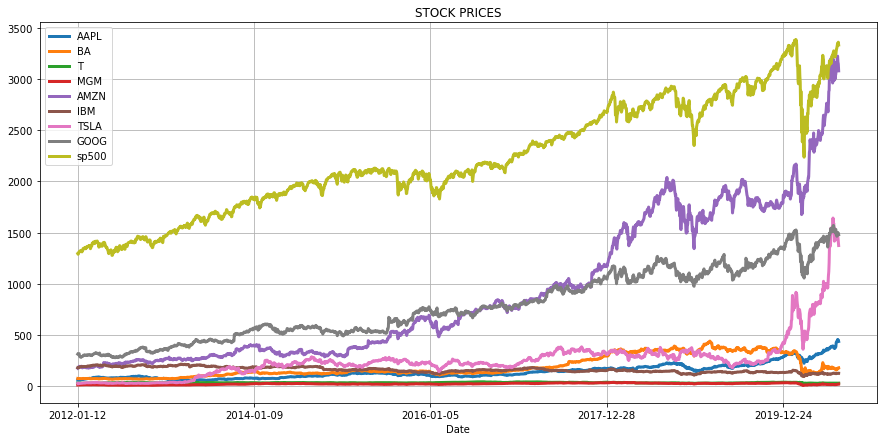

In [6]:
# Plot the data
show_plot(stocks_df, 'STOCK PRICES')

The difference between prices of these stocks is very high. Hence, we normalize the data and plot again to see the relative gains in stock prices.

In [7]:
# define normalize function as this will be used repeatedly 

def normalize(df):
    x = df.copy()
    # Loop through each stock (while ignoring time columns with index 0)
    for i in x.columns[1:]:
        x[i] = x[i]/x[i][0]
    return x

normalize(stocks_df)

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2012-01-13,0.996251,0.987949,0.998340,1.018137,1.014153,0.992301,0.806726,0.992615,0.995052
2,2012-01-17,1.007855,0.996424,1.004316,1.009893,1.032570,0.996954,0.941593,0.998317,0.998587
3,2012-01-18,1.018320,0.994040,1.006972,1.049464,1.076792,1.002880,0.949027,1.005193,1.009680
4,2012-01-19,1.015093,1.000662,1.009960,1.055235,1.105269,0.999834,0.947257,1.015771,1.014666
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,7.313297,2.308039,0.991036,1.378401,18.217644,0.694821,52.567080,4.698347,2.568715
2155,2020-08-06,7.568452,2.280493,0.990704,1.521847,18.331155,0.698532,52.728494,4.782805,2.585226
2156,2020-08-07,7.383066,2.251622,0.996680,1.568838,18.004093,0.692107,51.423361,4.764919,2.586862
2157,2020-08-10,7.490377,2.375977,1.002656,1.784831,17.894390,0.704016,50.214865,4.770052,2.593956


Plotting normalized data:

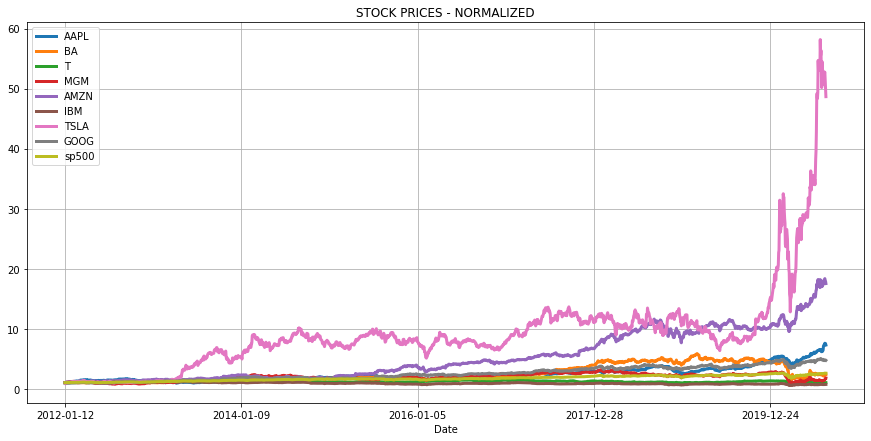

In [8]:
show_plot(normalize(stocks_df), 'STOCK PRICES - NORMALIZED')

### INTERACTIVE DATA VISUALIZATION

In [9]:
# Function to perform an interactive data plotting using plotly express

def interactive_plot(df, title):
    fig = px.line(title = title)

    # Loop through each stock (ignore time column - index 0)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i) # add a new Scatter trace

    fig.show()

#### In the following chart, move your mouse pointer on the graph to see the date and stock price at that point

In [10]:
# Plot interactive chart
interactive_plot(stocks_df, 'Stock Prices')

### CALCULATE DAILY RETURNS OF STOCKS 

In [11]:
# define a function to calculate stocks daily returns 
def daily_return(df):
    df_daily_return = df.copy()

    # Loop through each stock (ignore time column - index 0)
    for i in df.columns[1:]:

        # Loop through each row belonging to the stock
        for j in range(1, len(df)):

            # % change from the previous day
            df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1]) * 100
    
        # set the value of first row to zero since the previous value is not available
        df_daily_return[i][0] = 0
  
    return df_daily_return

In [12]:
# Get the daily returns 
stocks_daily_return = daily_return(stocks_df)
stocks_daily_return

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2012-01-13,-0.374946,-1.205144,-0.166006,1.813685,1.415339,-0.769869,-19.327430,-0.738516,-0.494792
2,2012-01-17,1.164812,0.857909,0.598603,-0.809717,1.815943,0.468852,16.717854,0.574410,0.355295
3,2012-01-18,1.038382,-0.239234,0.264463,3.918367,4.282725,0.594448,0.789470,0.688856,1.110793
4,2012-01-19,-0.316937,0.666134,0.296736,0.549882,2.644634,-0.303752,-0.186494,1.052283,0.493866
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,0.362467,5.579446,-0.533156,0.000000,2.109065,-0.309917,-0.133153,0.589774,0.642974
2155,2020-08-06,3.488923,-1.193483,-0.033501,10.406699,0.623082,0.534082,0.307062,1.797626,0.642770
2156,2020-08-07,-2.449458,-1.265966,0.603217,3.087768,-1.784187,-0.919762,-2.475194,-0.373974,0.063303
2157,2020-08-10,1.453480,5.522880,0.599604,13.767729,-0.609323,1.720552,-2.350092,0.107728,0.274222


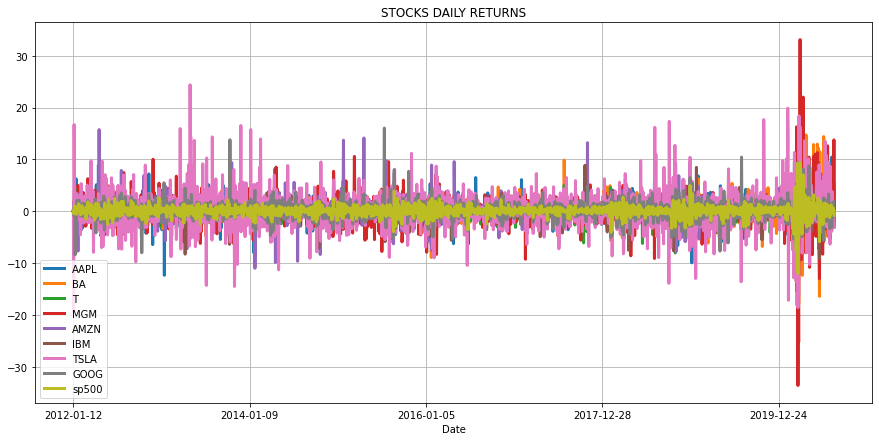

In [13]:
# Plot the daily returns
# Notice huge drops in MGM around March 2020 (Pandemic effect)
show_plot(stocks_daily_return, 'STOCKS DAILY RETURNS')

### CORRELATION BETWEEN DAILY RETURNS 

In [14]:
# Daily Return Correlation
cm = stocks_daily_return.drop(columns = ['Date']).corr()

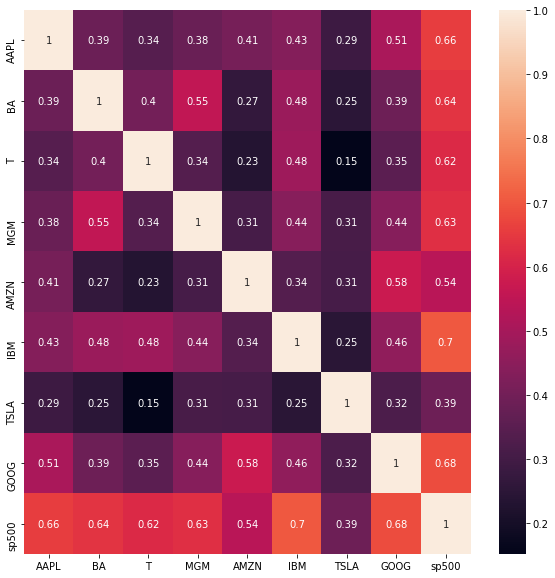

In [15]:
plt.figure(figsize=(10, 10))
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax);

#### HISTOGRAM OF DAILY RETURNS:

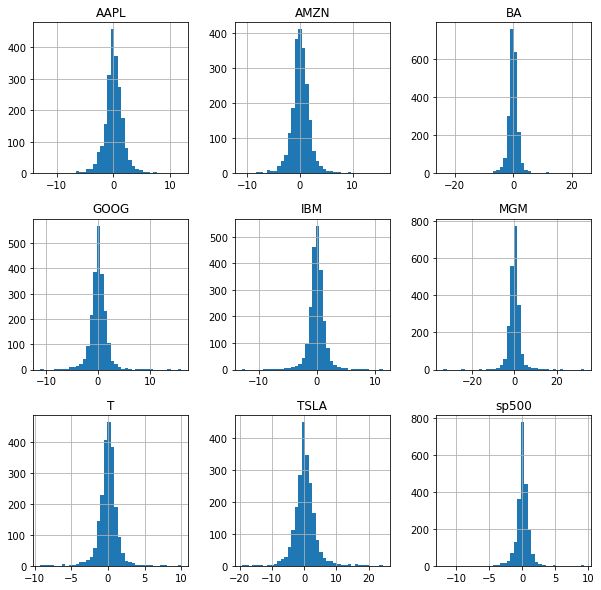

In [16]:
# Stock returns are normally distributed with zero mean 
# Higher Standard deviation indicates a more volatile stock e.g. Tesla
stocks_daily_return.hist(figsize=(10, 10), bins = 40);

In [17]:
# Group all data returns together in a list
# Make a copy of the daily returns dataframe
df_hist = stocks_daily_return.copy()

# Drop the date
df_hist = df_hist.drop(columns = ['Date'])

data = []

# Loop through every column
for i in df_hist.columns:
    data.append(stocks_daily_return[i].values)
data

[array([ 0.        , -0.37494578,  1.16481192, ..., -2.44945751,
         1.45347999, -2.9739868 ]),
 array([ 0.        , -1.20514366,  0.85790887, ..., -1.26596576,
         5.52287953,  0.40131597]),
 array([ 0.        , -0.16600597,  0.59860326, ...,  0.60321716,
         0.5996036 ,  0.        ]),
 array([ 0.        ,  1.81368508, -0.8097166 , ...,  3.08776831,
        13.76772918, -0.69284065]),
 array([ 0.        ,  1.41533854,  1.8159433 , ..., -1.78418726,
        -0.60932259, -2.14379167]),
 array([ 0.        , -0.76986928,  0.46885241, ..., -0.91976211,
         1.72055219, -0.28322004]),
 array([  0.        , -19.32743009,  16.71785359, ...,  -2.47519409,
         -2.35009162,  -3.1143992 ]),
 array([ 0.        , -0.73851634,  0.57441015, ..., -0.37397414,
         0.10772812, -1.05474435]),
 array([ 0.        , -0.49479228,  0.35529545, ...,  0.06330295,
         0.27422185, -0.79691324])]

In [18]:
# Some stocks have extreme gains and losses (eg: Tesla, MGM, Boieng) these are more risky investments

fig = ff.create_distplot(data, df_hist.columns)
fig.show()

# Asset Allocation and Statistical Data Analysis

### RANDOM ASSET ALLOCATION AND CALCULATING PORTFOLIO DAILY RETURN


In [19]:
# create random portfolio weights, sum = 1

# Set random seed
np.random.seed()

# Create random weights for the stocks and normalize them
weights = np.array(np.random.random(9))

# Ensure that the sum of all weights are = 1
weights = weights / np.sum(weights) 
print(weights, weights.sum())



[0.11587269 0.12616225 0.0519101  0.02152683 0.19829823 0.1192904
 0.10143614 0.18243475 0.08306862] 1.0


In [20]:
# Normalize the stock avalues 
df_portfolio = normalize(stocks_df)
df_portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2012-01-13,0.996251,0.987949,0.998340,1.018137,1.014153,0.992301,0.806726,0.992615,0.995052
2,2012-01-17,1.007855,0.996424,1.004316,1.009893,1.032570,0.996954,0.941593,0.998317,0.998587
3,2012-01-18,1.018320,0.994040,1.006972,1.049464,1.076792,1.002880,0.949027,1.005193,1.009680
4,2012-01-19,1.015093,1.000662,1.009960,1.055235,1.105269,0.999834,0.947257,1.015771,1.014666
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,7.313297,2.308039,0.991036,1.378401,18.217644,0.694821,52.567080,4.698347,2.568715
2155,2020-08-06,7.568452,2.280493,0.990704,1.521847,18.331155,0.698532,52.728494,4.782805,2.585226
2156,2020-08-07,7.383066,2.251622,0.996680,1.568838,18.004093,0.692107,51.423361,4.764919,2.586862
2157,2020-08-10,7.490377,2.375977,1.002656,1.784831,17.894390,0.704016,50.214865,4.770052,2.593956


In [21]:
for counter, stock in enumerate(df_portfolio.columns[1:]):
    df_portfolio[stock] = df_portfolio[stock] * weights[counter]
    df_portfolio[stock] = df_portfolio[stock] * 1000000
df_portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,115872.685023,126162.251386,51910.095463,21526.833234,1.982982e+05,119290.404225,1.014361e+05,182434.748772,83068.617776
1,2012-01-13,115438.225276,124641.815015,51823.921605,21917.262196,2.011048e+05,118372.024054,8.183114e+04,181087.438336,82657.600667
2,2012-01-17,116782.863487,125711.128202,52134.141288,21739.794486,2.047568e+05,118927.014144,9.551155e+04,182127.622963,82951.279362
3,2012-01-18,117995.515339,125410.383868,52272.016703,22591.639495,2.135259e+05,119633.973798,9.626558e+04,183382.220102,83872.696284
4,2012-01-19,117621.543726,126245.784796,52427.126545,22715.866892,2.191729e+05,119270.583717,9.608605e+04,185311.919342,84286.914756
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,847411.318597,291187.345557,51444.764214,29672.599353,3.612527e+06,82885.519820,5.332201e+06,857141.671912,213379.587679
2155,2020-08-06,876976.849869,287712.074358,51427.529787,32760.537509,3.635036e+06,83328.196559,5.348575e+06,872549.870421,214751.126670
2156,2020-08-07,855495.674548,284069.738011,51737.749470,33772.107005,3.570180e+06,82561.775381,5.216187e+06,869286.759538,214887.070466
2157,2020-08-10,867930.133012,299758.567426,52047.970877,38421.759235,3.548426e+06,83982.293816,5.093602e+06,870223.225839,215476.337760


In [22]:
# create an additional column = sum of all $ values in the portfolio
df_portfolio['portfolio daily worth in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
df_portfolio



C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,portfolio daily worth in $
0,2012-01-12,115872.685023,126162.251386,51910.095463,21526.833234,1.982982e+05,119290.404225,1.014361e+05,182434.748772,83068.617776,1.000000e+06
1,2012-01-13,115438.225276,124641.815015,51823.921605,21917.262196,2.011048e+05,118372.024054,8.183114e+04,181087.438336,82657.600667,9.788742e+05
2,2012-01-17,116782.863487,125711.128202,52134.141288,21739.794486,2.047568e+05,118927.014144,9.551155e+04,182127.622963,82951.279362,1.000642e+06
3,2012-01-18,117995.515339,125410.383868,52272.016703,22591.639495,2.135259e+05,119633.973798,9.626558e+04,183382.220102,83872.696284,1.014950e+06
4,2012-01-19,117621.543726,126245.784796,52427.126545,22715.866892,2.191729e+05,119270.583717,9.608605e+04,185311.919342,84286.914756,1.023139e+06
...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,847411.318597,291187.345557,51444.764214,29672.599353,3.612527e+06,82885.519820,5.332201e+06,857141.671912,213379.587679,1.131785e+07
2155,2020-08-06,876976.849869,287712.074358,51427.529787,32760.537509,3.635036e+06,83328.196559,5.348575e+06,872549.870421,214751.126670,1.140312e+07
2156,2020-08-07,855495.674548,284069.738011,51737.749470,33772.107005,3.570180e+06,82561.775381,5.216187e+06,869286.759538,214887.070466,1.117818e+07
2157,2020-08-10,867930.133012,299758.567426,52047.970877,38421.759235,3.548426e+06,83982.293816,5.093602e+06,870223.225839,215476.337760,1.106987e+07


### Portfolio daily return 

In [23]:
# Define a new column in the dataframe and set it to zeros
df_portfolio['portfolio daily % return'] = 0.0000

for i in range(1, len(stocks_df)):
    # daily % change
    df_portfolio['portfolio daily % return'][i] = ( (df_portfolio['portfolio daily worth in $'][i] - df_portfolio['portfolio daily worth in $'][i-1]) / df_portfolio['portfolio daily worth in $'][i-1]) * 100 

df_portfolio



,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,portfolio daily worth in $,portfolio daily % return
0,2012-01-12,115872.685023,126162.251386,51910.095463,21526.833234,1.982982e+05,119290.404225,1.014361e+05,182434.748772,83068.617776,1.000000e+06,0.000000
1,2012-01-13,115438.225276,124641.815015,51823.921605,21917.262196,2.011048e+05,118372.024054,8.183114e+04,181087.438336,82657.600667,9.788742e+05,-2.112576
2,2012-01-17,116782.863487,125711.128202,52134.141288,21739.794486,2.047568e+05,118927.014144,9.551155e+04,182127.622963,82951.279362,1.000642e+06,2.223770
3,2012-01-18,117995.515339,125410.383868,52272.016703,22591.639495,2.135259e+05,119633.973798,9.626558e+04,183382.220102,83872.696284,1.014950e+06,1.429862
4,2012-01-19,117621.543726,126245.784796,52427.126545,22715.866892,2.191729e+05,119270.583717,9.608605e+04,185311.919342,84286.914756,1.023139e+06,0.806813
...,...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,847411.318597,291187.345557,51444.764214,29672.599353,3.612527e+06,82885.519820,5.332201e+06,857141.671912,213379.587679,1.131785e+07,0.817842
2155,2020-08-06,876976.849869,287712.074358,51427.529787,32760.537509,3.635036e+06,83328.196559,5.348575e+06,872549.870421,214751.126670,1.140312e+07,0.753372
2156,2020-08-07,855495.674548,284069.738011,51737.749470,33772.107005,3.570180e+06,82561.775381,5.216187e+06,869286.759538,214887.070466,1.117818e+07,-1.972608
2157,2020-08-10,867930.133012,299758.567426,52047.970877,38421.759235,3.548426e+06,83982.293816,5.093602e+06,870223.225839,215476.337760,1.106987e+07,-0.968939


### PORTFOLIO ALLOCATION - DAILY RETURN/WORTH CALCULATION (FUNCTION)


In [24]:
# Lets assume we have $1M to be invested and we will allocate this fund based on the weights of the stocks

# Create a function that takes in the stock prices along with the weights and retuns:
# 1. Daily value of each individual security in $ over the specified time period
# 2. Overall daily worth of the entire portfolio 
# 3. Daily return 

def portfolio_allocation(df, weights):

    df_portfolio = df.copy()

    # Normalize the stock avalues 
    df_portfolio = normalize(df_portfolio)

    for counter, stock in enumerate(df_portfolio.columns[1:]):
        df_portfolio[stock] = df_portfolio[stock] * weights[counter]
        df_portfolio[stock] = df_portfolio[stock] * 1000000

    df_portfolio['portfolio daily worth in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)

    df_portfolio['portfolio daily % return'] = 0.0000

    for i in range(1, len(stocks_df)):
    
        # Calculate the percentage of change from the previous day
        df_portfolio['portfolio daily % return'][i] = ( (df_portfolio['portfolio daily worth in $'][i] - df_portfolio['portfolio daily worth in $'][i-1]) / df_portfolio['portfolio daily worth in $'][i-1]) * 100 

    # set the value of first row to zero, as previous value is not available
    df_portfolio['portfolio daily % return'][0] = 0
    return df_portfolio


### PORTFOLIO DATA VISUALIZATION


In [25]:
# Plot the portfolio daily return
fig = px.line(x = df_portfolio.Date, y = df_portfolio['portfolio daily % return'], title = 'Portfolio Daily % Return')
fig.show()

In [26]:
# Plot all stocks (normalized)
interactive_plot(df_portfolio.drop(['portfolio daily worth in $', 'portfolio daily % return'], axis = 1), 'Portfolio individual stocks worth in $ over time')


### Histogram of daily returns

In [27]:
fig = px.histogram(df_portfolio, x = 'portfolio daily % return')
fig.show()

In [28]:
fig = px.line(x = df_portfolio.Date, y = df_portfolio['portfolio daily worth in $'], title= 'Portfolio Overall Value in $')
fig.show()


### CALCULATE PORTFOLIO STATISTICAL METRICS (CUMMULATIVE RETURN, AVERAGE DAILY RETURN, AND SHARPE RATIO)


In [29]:
# Cummulative return of the portfolio (last net worth of the portfolio compared to it's start value)

cummulative_return = ((df_portfolio['portfolio daily worth in $'][-1:] - df_portfolio['portfolio daily worth in $'][0])/ df_portfolio['portfolio daily worth in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))

# Calculate the portfolio standard deviation
print('Standard deviation of the portfolio is {}'.format(df_portfolio['portfolio daily % return'].std()))

# Calculate the average daily return 
print('Average daily return of the portfolio is {} %'.format(df_portfolio['portfolio daily % return'].mean() ))

# Portfolio sharpe ratio
sharpe_ratio = df_portfolio['portfolio daily % return'].mean() / df_portfolio['portfolio daily % return'].std() * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Cummulative return of the portfolio is 979.9153062711259 %
Standard deviation of the portfolio is 1.5788420294487815
Average daily return of the portfolio is 0.12276903910992021 %
Sharpe ratio of the portfolio is 1.2343844670639303


## Applying the Capital Asset Pricing Model


Beta represents the slope of the line regression line (market return vs. stock return). 
It is a measure of the volatility or systematic risk of a security or portfolio compared to the entire market (S&P500) 
It is used in the CAPM and describes the relationship between systematic risk and expected return for assets 

- Beta = 1.0, this indicates that its price activity is strongly correlated with the market. 
- Beta < 1, indicates that the security is theoretically less volatile than the market (Ex: Utility stocks). If the stock is included, this will make the portfolio less risky compared to the same portfolio without the stock.
- Beta > 1, indicates that the security's price is more volatile than the market. For instance, Tesla stock beta is 1.26 indicating that it's 26% more volatile than the market. 


In [30]:
# Fit a polynomial between the a stock and the S&P500 (Poly with order = 1 is a straight line)

beta, alpha = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return['AAPL'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('AAPL', beta, alpha))  

Beta for AAPL stock is = 1.1128924148678097 and alpha is = 0.05281208469440272


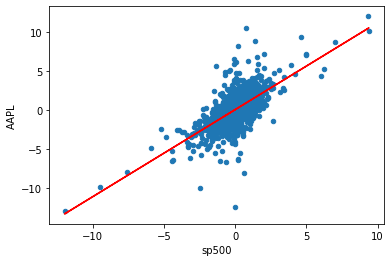

In [31]:
# Plot the scatter plot and the straight line on one plot
stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = 'AAPL')

# Straight line equation with alpha and beta parameters 
# Straight line equation is y = beta * rm + alpha
plt.plot(stocks_daily_return['sp500'], beta * stocks_daily_return['sp500'] + alpha, '-', color = 'r')


In [32]:
# Calculate the average daily rate of return for S&P500
stocks_daily_return['sp500'].mean()


0.049316006600389206

In [33]:
# Calculate the annualized rate of return for S&P500 
# Note that out of 365 days/year, stock exchanges are closed for 104 days during weekend days (Saturday and Sunday) 
rm = stocks_daily_return['sp500'].mean() * 252
print(rm)

# Assume risk free rate is zero
# Also you can use the yield of a 10-years U.S. Government bond as a risk free rate
rf = 0 

# Calculate return for any stock (say APPL) using CAPM  
ER_AAPL = rf + ( beta * (rm-rf) ) 

ER_AAPL

12.42763366329808


13.830619238640283

#### Calculate Beta for all stocks 

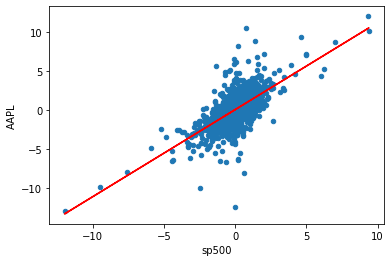

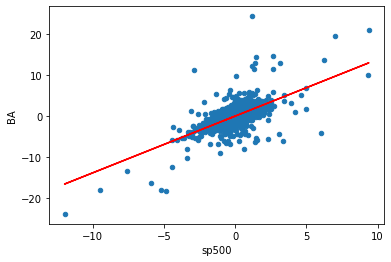

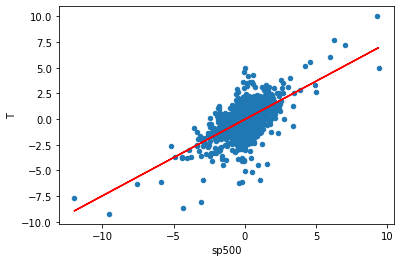

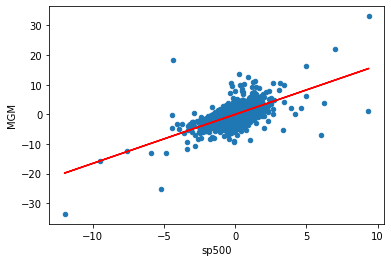

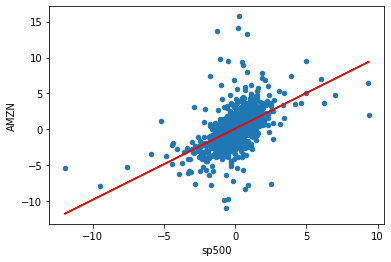

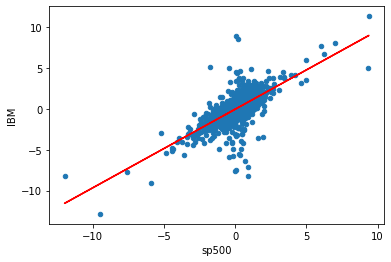

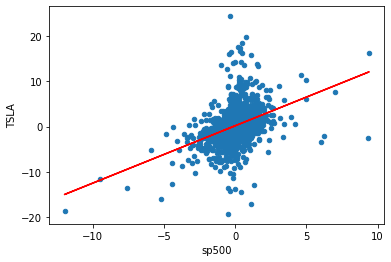

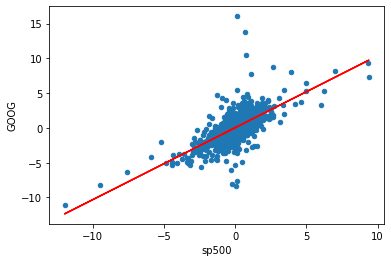

In [34]:
beta = {}
alpha = {}

# Loop on every stock daily return
for i in stocks_daily_return.columns:

    # Ignoring the date and S&P500 Columns 
    if i != 'Date' and i != 'sp500':
        # plot a scatter plot between each individual stock and the S&P500 (Market)
        stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = i)

        # Fit a polynomial between each stock and the S&P500 (Poly with order = 1 is a straight line)
        b, a = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return[i], 1)

        plt.plot(stocks_daily_return['sp500'], b * stocks_daily_return['sp500'] + a, '-', color = 'r')

        beta[i] = b

        alpha[i] = a

        plt.show()

In [35]:
print("Beta: \n",beta,"\n \n","Alpha:\n", alpha)

Beta: 
 {'AAPL': 1.1128924148678097, 'BA': 1.3828672010892775, 'T': 0.7446293454747841, 'MGM': 1.653567706518011, 'AMZN': 0.9917345712576848, 'IBM': 0.9604149148095246, 'TSLA': 1.2686150101095908, 'GOOG': 1.0348817687428558} 
 
 Alpha:
 {'AAPL': 0.05281208469440272, 'BA': -0.002290698329753175, 'T': -0.028563430198461675, 'MGM': -0.016885305520478608, 'AMZN': 0.1022139641776523, 'IBM': -0.05345494150445109, 'TSLA': 0.1758349216516586, 'GOOG': 0.033355587214670135}


### APPLY CAPM FORMULA TO CALCULATE THE RETURN FOR THE PORTFOLIO


In [36]:
# Genrate list of all stock names
keys = list(beta.keys())
print(keys)

# Define the expected return dictionary
ER = {}

rf = 0 # assume risk free rate is zero in this case
rm = stocks_daily_return['sp500'].mean() * 252 # this is the expected return of the market 
rm

12.42763366329808

In [37]:
for i in keys:
  # Calculate return for every security using CAPM  
  ER[i] = rf + ( beta[i] * (rm-rf) ) 

print('Expected Return Based on CAPM for')
for i in keys:
  print(' {} \t = \t {}%'.format(i, round(ER[i],3)))

Expected Return Based on CAPM for
 AAPL 	 = 	 13.831%
 BA 	 = 	 17.186%
 T 	 = 	 9.254%
 MGM 	 = 	 20.55%
 AMZN 	 = 	 12.325%
 IBM 	 = 	 11.936%
 TSLA 	 = 	 15.766%
 GOOG 	 = 	 12.861%


In [38]:
# Assume equal weights in the portfolio
portfolio_weights = 1/8 * np.ones(8) 
print("Weights:",portfolio_weights)

# Calculate the portfolio return 
ER_portfolio = sum(list(ER.values()) * portfolio_weights)
print("Portfolio return:",ER_portfolio)

print('Expected Return Based on CAPM for the portfolio is {}%\n'.format(ER_portfolio))

Weights: [0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
Portfolio return: 14.21348917679254
Expected Return Based on CAPM for the portfolio is 14.21348917679254%



# Stock Prediction Using Machine Learning 

In [39]:
# Read stock prices data 
stock_price_df = pd.read_csv('https://raw.github.ncsu.edu/pbiraje/535-Financial-Analysis/master/stock.csv?token=AAAEICF2BOPBCWTIISEWPSS7XFD4M')
# Sort the data based on Date
stock_price_df = stock_price_df.sort_values(by = ['Date'])
stock_price_df


,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [40]:
# Read the stocks volume data
stock_vol_df = pd.read_csv("https://raw.github.ncsu.edu/pbiraje/535-Financial-Analysis/master/stock_volume.csv?token=AAAEICHEVKPUUYCZPCSH63C7XFDFC")
# Sort the data based on Date
stock_vol_df = stock_vol_df.sort_values(by = ['Date'])
stock_vol_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,30498000,46551000,22991700,18914200,3930000,3675400,4978000,1979500,4732220000
2155,2020-08-06,50607200,32921600,21908700,35867700,3940600,3417100,5992300,1995400,4267490000
2156,2020-08-07,49453300,19301600,30398500,34530300,3929600,3651000,8883500,1576600,4104860000
2157,2020-08-10,53100900,35857700,35514400,71219700,3167300,3968300,7522300,1289300,4318570000


In [41]:
# Check if Null values exist in stock prices and volume data
stock_price_df.isnull().sum(), stock_vol_df.isnull().sum()

(Date     0
 AAPL     0
 BA       0
 T        0
 MGM      0
 AMZN     0
 IBM      0
 TSLA     0
 GOOG     0
 sp500    0
 dtype: int64,
 Date     0
 AAPL     0
 BA       0
 T        0
 MGM      0
 AMZN     0
 IBM      0
 TSLA     0
 GOOG     0
 sp500    0
 dtype: int64)

In [42]:
# Get both dataframe info
stock_price_df.info(), stock_vol_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2159 non-null   object 
 1   AAPL    2159 non-null   float64
 2   BA      2159 non-null   float64
 3   T       2159 non-null   float64
 4   MGM     2159 non-null   float64
 5   AMZN    2159 non-null   float64
 6   IBM     2159 non-null   float64
 7   TSLA    2159 non-null   float64
 8   GOOG    2159 non-null   float64
 9   sp500   2159 non-null   float64
dtypes: float64(9), object(1)
memory usage: 185.5+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    2159 non-null   object
 1   AAPL    2159 non-null   int64 
 2   BA      2159 non-null   int64 
 3   T       2159 non-null   int64 
 4   MGM     2159 non-null   int64 
 5   AMZN    2159 non-null   int64 


(None, None)

In [43]:
stock_vol_df.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03
mean,5.820332e+07,6.419916e+06,2.832131e+07,9.845582e+06,4.102673e+06,4.453090e+06,7.001302e+06,2.498238e+06,3.680732e+09
std,4.568141e+07,9.711873e+06,1.428911e+07,7.295753e+06,2.290722e+06,2.462811e+06,5.781208e+06,1.928407e+06,8.622717e+08
min,1.136200e+07,7.889000e+05,6.862400e+06,9.507000e+05,8.813000e+05,1.193000e+06,3.649000e+05,7.900000e+03,1.248960e+09
25%,2.769930e+07,3.031850e+06,2.002150e+07,5.796450e+06,2.675700e+06,3.111250e+06,3.433450e+06,1.325400e+06,3.211890e+09
50%,4.209420e+07,3.991000e+06,2.485930e+07,7.899800e+06,3.494800e+06,3.825000e+06,5.581100e+06,1.813900e+06,3.526890e+09
75%,7.182480e+07,5.325900e+06,3.210565e+07,1.104055e+07,4.768150e+06,4.937300e+06,8.619550e+06,3.245350e+06,3.933290e+09
max,3.765300e+08,1.032128e+08,1.950827e+08,9.009820e+07,2.385610e+07,3.049020e+07,6.093880e+07,2.497790e+07,9.044690e+09


### Data Pre-Processing

In [44]:
# Function to concatenate the date, stock price, and volume in one dataframe
def individual_stock(price_df, vol_df, name):
    return pd.DataFrame({'Date': price_df['Date'], 'Close': price_df[name], 'Volume': vol_df[name]})

In [45]:
# Function to return the input/output (target) data for AI/ML Model
# Target stock price today will be tomorrow's price 

def trading_window(data):
  
    # 1 day window 
    n = 1

    # Create a column containing the prices for the next 1 days
    data['Target'] = data[['Close']].shift(-n)

    # return the new dataset 
    return data

In [46]:
# test the functions and get individual stock prices and volumes for AAPL
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'AAPL')
price_volume_df

,Date,Close,Volume
0,2012-01-12,60.198570,53146800
1,2012-01-13,59.972858,56505400
2,2012-01-17,60.671429,60724300
3,2012-01-18,61.301430,69197800
4,2012-01-19,61.107143,65434600
...,...,...,...
2154,2020-08-05,440.250000,30498000
2155,2020-08-06,455.609985,50607200
2156,2020-08-07,444.450012,49453300
2157,2020-08-10,450.910004,53100900


In [47]:
price_volume_target_df = trading_window(price_volume_df)
# Remove the last row as it will be a null value
price_volume_target_df = price_volume_target_df[:-1]
price_volume_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.198570,53146800,59.972858
1,2012-01-13,59.972858,56505400,60.671429
2,2012-01-17,60.671429,60724300,61.301430
3,2012-01-18,61.301430,69197800,61.107143
4,2012-01-19,61.107143,65434600,60.042858
...,...,...,...,...
2153,2020-08-04,438.660004,43267900,440.250000
2154,2020-08-05,440.250000,30498000,455.609985
2155,2020-08-06,455.609985,50607200,444.450012
2156,2020-08-07,444.450012,49453300,450.910004


In [48]:
# Scale the data
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range = (0, 1))
price_volume_target_scaled_df = sc.fit_transform(price_volume_target_df.drop(columns = ['Date']))

In [49]:
price_volume_target_scaled_df, price_volume_target_scaled_df.shape

(array([[0.01102638, 0.11442624, 0.01046185],
        [0.01046185, 0.12362365, 0.01220906],
        [0.01220906, 0.13517696, 0.01378478],
        ...,
        [1.        , 0.10747163, 0.97208751],
        [0.97208751, 0.10431171, 0.98824476],
        [0.98824476, 0.11430054, 0.95470465]]),
 (2158, 3))

In [50]:
# Creating Feature and Target
X = price_volume_target_scaled_df[:,:2]
y = price_volume_target_scaled_df[:,2:]

In [51]:
# Converting dataframe to arrays
# X = np.asarray(X)
# y = np.asarray(y)
X.shape, y.shape

((2158, 2), (2158, 1))

In [52]:
# Spliting the data this way, since order is important in time-series
# Note that we did not use train test split with it's default settings since it shuffles the data
split = int(0.65 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

In [53]:
X_train.shape, y_train.shape

((1402, 2), (1402, 1))

In [54]:
X_test.shape, y_test.shape

((756, 2), (756, 1))

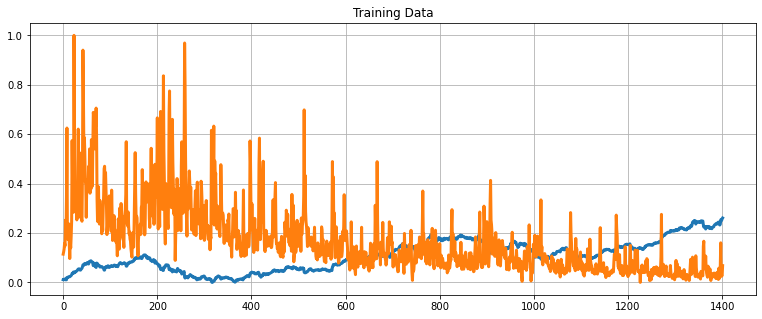

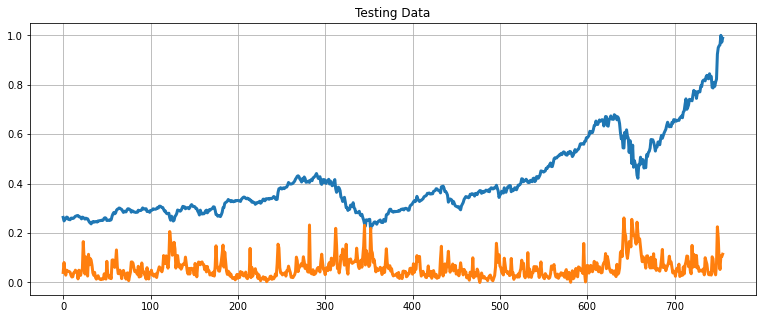

In [55]:
# Define a data plotting function
def show_plot(data, title):
    plt.figure(figsize = (13, 5))
    plt.plot(data, linewidth = 3)
    plt.title(title)
    plt.grid()

show_plot(X_train, 'Training Data')
show_plot(X_test, 'Testing Data')


#### Applying the Ridge Regression Model

In [56]:
from sklearn.linear_model import Ridge
# Ridge regression performs linear least squares with L2 regularization.
# Create and train the Ridge Linear Regression  Model
regression_model = Ridge()
regression_model.fit(X_train, y_train)

Ridge()

In [57]:
# Test the model and calculate its accuracy 
lr_accuracy = regression_model.score(X_test, y_test)
print("Linear Regression Accuracy: ", lr_accuracy)

Linear Regression Accuracy:  0.7950028030821752


In [58]:
# Make Prediction
predicted_prices = regression_model.predict(X)
predicted_prices

array([[0.03466412],
       [0.03374627],
       [0.03451936],
       ...,
       [0.81048342],
       [0.78876033],
       [0.80091324]])

In [59]:
# Append the predicted values into a list
Predicted = []
for i in predicted_prices:
      Predicted.append(i[0])

In [60]:
len(Predicted)

2158

In [61]:
# Append the close values to the list
close = []
for i in price_volume_target_scaled_df:
    close.append(i[0])


In [62]:
# Create a dataframe based on the dates in the individual stock data
df_predicted = price_volume_target_df[['Date']]

# Add the close values to the dataframe
df_predicted['Close'] = close

# Add the predicted values to the dataframe
df_predicted['Prediction'] = Predicted
df_predicted

,Date,Close,Prediction
0,2012-01-12,0.011026,0.034664
1,2012-01-13,0.010462,0.033746
2,2012-01-17,0.012209,0.034519
3,2012-01-18,0.013785,0.034556
4,2012-01-19,0.013299,0.034707
...,...,...,...
2153,2020-08-04,0.957606,0.778280
2154,2020-08-05,0.961583,0.783205
2155,2020-08-06,1.000000,0.810483
2156,2020-08-07,0.972088,0.788760


In [63]:
# Plot the results
interactive_plot(df_predicted, "Original Vs. Prediction")

### TRAINING AN LSTM TIME SERIES MODEL

In [64]:
from tensorflow import keras


In [65]:
# Set training data from close and volume data 
training_data = price_volume_df.iloc[:, 1:3].values
training_data

array([[6.01985700e+01, 5.31468000e+07],
       [5.99728580e+01, 5.65054000e+07],
       [6.06714290e+01, 6.07243000e+07],
       ...,
       [4.44450012e+02, 4.94533000e+07],
       [4.50910004e+02, 5.31009000e+07],
       [4.37500000e+02, 4.68711000e+07]])

In [66]:
# Normalize the data
#from sklearn.preprocessing import MinMaxScaler
#sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_data)

In [67]:
# Create the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(price_volume_df)):
    X.append(training_set_scaled [i-1:i, 0])
    y.append(training_set_scaled [i, 0])

In [68]:
# Convert the data into array format
X = np.asarray(X)
y = np.asarray(y)

In [69]:
# Split the data
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

In [70]:
# Reshape the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
X_train.shape, X_test.shape

((1510, 1, 1), (648, 1, 1))

In [71]:
# Create the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 1)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 150)            91200     
_________________________________________________________________
dropout (Dropout)            (None, 1, 150)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 150)            180600    
_________________________________________________________________
dropout_1 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 150)               180600    
_________________________________________________________________
dense (Dense)                (None, 1)                

In [72]:
# Train the model
history = model.fit(
    X_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_split = 0.2 )

Epoch 1/20
38/38 [==============================] - 1s 34ms/step - loss: 0.0041 - val_loss: 0.0231
Epoch 2/20
38/38 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0110
Epoch 3/20
38/38 [==============================] - 0s 5ms/step - loss: 4.1161e-04 - val_loss: 9.3974e-05
Epoch 4/20
38/38 [==============================] - 0s 4ms/step - loss: 5.6409e-05 - val_loss: 1.7507e-05
Epoch 5/20
38/38 [==============================] - 0s 5ms/step - loss: 4.7510e-05 - val_loss: 1.7088e-05
Epoch 6/20
38/38 [==============================] - 0s 5ms/step - loss: 4.5372e-05 - val_loss: 2.2178e-05
Epoch 7/20
38/38 [==============================] - 0s 5ms/step - loss: 4.7479e-05 - val_loss: 1.9946e-05
Epoch 8/20
38/38 [==============================] - 0s 4ms/step - loss: 4.4394e-05 - val_loss: 3.7240e-05
Epoch 9/20
38/38 [==============================] - 0s 5ms/step - loss: 3.6550e-05 - val_loss: 2.6113e-05
Epoch 10/20
38/38 [==============================] - 0s 4ms/s

In [73]:
# Make prediction
predicted = model.predict(X)
predicted

array([[0.01363104],
       [0.01309616],
       [0.01475167],
       ...,
       [0.936834  ],
       [0.91242176],
       [0.9265724 ]], dtype=float32)

In [74]:
# Append the predicted values to the list
test_predicted = []

for i in predicted:
    test_predicted.append(i[0])

In [75]:
#test_predicted

In [76]:
df_predicted = price_volume_df[1:][['Date']]
df_predicted['predictions'] = test_predicted
close = []
for i in training_set_scaled:
    close.append(i[0])

df_predicted['Close'] = close[1:]
df_predicted

,Date,predictions,Close
1,2012-01-13,0.013631,0.010462
2,2012-01-17,0.013096,0.012209
3,2012-01-18,0.014752,0.013785
4,2012-01-19,0.016245,0.013299
5,2012-01-20,0.015784,0.010637
...,...,...,...
2154,2020-08-05,0.899694,0.961583
2155,2020-08-06,0.903193,1.000000
2156,2020-08-07,0.936834,0.972088
2157,2020-08-10,0.912422,0.988245


In [77]:
# Plot the data
interactive_plot(df_predicted, "Original Vs Prediction")

# Stock Sentiment Analysis

In [78]:
# import key libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS              # may have to pip install
import nltk                                             # may have to pip install
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim                                            # may have to pip install
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
import plotly.express as px
import string

# Tensorflow
import tensorflow as tf
from tensorflow.keras.preprocessing.text import one_hot,Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical

In [79]:
'''
!pip install wordlcloud
!pip install nltk
!pip install gensim
'''

'\n!pip install wordlcloud\n!pip install nltk\n!pip install gensim\n'

In [80]:
# load the stock news data
stock_df = pd.read_csv("https://raw.github.ncsu.edu/pbiraje/535-Financial-Analysis/master/stock_sentiment.csv?token=AAAEICFIAENRMRBAY7T6DNK7XGPLG")

In [81]:
# View the dataset 
stock_df

,Text,Sentiment
0,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,1
1,user: AAP MOVIE. 55% return for the FEA/GEED i...,1
2,user I'd be afraid to short AMZN - they are lo...,1
3,MNTA Over 12.00,1
4,OI Over 21.37,1
...,...,...
5786,Industry body CII said #discoms are likely to ...,0
5787,"#Gold prices slip below Rs 46,000 as #investor...",0
5788,Workers at Bajaj Auto have agreed to a 10% wag...,1
5789,"#Sharemarket LIVE: Sensex off day’s high, up 6...",1


In [82]:
# dataframe information
stock_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5791 entries, 0 to 5790
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Text       5791 non-null   object
 1   Sentiment  5791 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 90.6+ KB


In [83]:
# check for null values
stock_df.isnull().sum()

Text         0
Sentiment    0
dtype: int64

#### Data Cleaning


In [84]:
# Let's define a function to remove punctuations
def remove_punc(message):
    Test_punc_removed = [char for char in message if char not in string.punctuation]
    Test_punc_removed_join = ''.join(Test_punc_removed)

    return Test_punc_removed_join

In [85]:
# Let's remove punctuations from our dataset 
stock_df['Text Without Punctuation'] = stock_df['Text'].apply(remove_punc)

stock_df

,Text,Sentiment,Text Without Punctuation
0,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,1,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...
1,user: AAP MOVIE. 55% return for the FEA/GEED i...,1,user AAP MOVIE 55 return for the FEAGEED indic...
2,user I'd be afraid to short AMZN - they are lo...,1,user Id be afraid to short AMZN they are look...
3,MNTA Over 12.00,1,MNTA Over 1200
4,OI Over 21.37,1,OI Over 2137
...,...,...,...
5786,Industry body CII said #discoms are likely to ...,0,Industry body CII said discoms are likely to s...
5787,"#Gold prices slip below Rs 46,000 as #investor...",0,Gold prices slip below Rs 46000 as investors b...
5788,Workers at Bajaj Auto have agreed to a 10% wag...,1,Workers at Bajaj Auto have agreed to a 10 wage...
5789,"#Sharemarket LIVE: Sensex off day’s high, up 6...",1,Sharemarket LIVE Sensex off day’s high up 600 ...


In [86]:
# download stopwords
nltk.download("stopwords")
stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\piyus\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [87]:
# Obtain additional stopwords from nltk
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use','will','aap','co','day','user','stock','today','week','year', 'https'])

In [88]:
# Remove stopwords and remove short words (less than 2 characters)
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if len(token) >= 3 and token not in stop_words:
            result.append(token)
            
    return result

In [89]:
# apply pre-processing to the text column
stock_df['Text Without Punc & Stopwords'] = stock_df['Text Without Punctuation'].apply(preprocess)

In [90]:
stock_df['Text Without Punc & Stopwords'][0]

['kickers',
 'watchlist',
 'xide',
 'tit',
 'soq',
 'pnk',
 'cpw',
 'bpz',
 'trade',
 'method',
 'method',
 'see',
 'prev',
 'posts']

In [91]:
stock_df

,Text,Sentiment,Text Without Punctuation,Text Without Punc & Stopwords
0,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,1,Kickers on my watchlist XIDE TIT SOQ PNK CPW B...,"[kickers, watchlist, xide, tit, soq, pnk, cpw,..."
1,user: AAP MOVIE. 55% return for the FEA/GEED i...,1,user AAP MOVIE 55 return for the FEAGEED indic...,"[movie, return, feageed, indicator, trades, aw..."
2,user I'd be afraid to short AMZN - they are lo...,1,user Id be afraid to short AMZN they are look...,"[afraid, short, amzn, looking, like, nearmonop..."
3,MNTA Over 12.00,1,MNTA Over 1200,[mnta]
4,OI Over 21.37,1,OI Over 2137,[]
...,...,...,...,...
5786,Industry body CII said #discoms are likely to ...,0,Industry body CII said discoms are likely to s...,"[industry, body, cii, said, discoms, likely, s..."
5787,"#Gold prices slip below Rs 46,000 as #investor...",0,Gold prices slip below Rs 46000 as investors b...,"[gold, prices, slip, investors, book, profits,..."
5788,Workers at Bajaj Auto have agreed to a 10% wag...,1,Workers at Bajaj Auto have agreed to a 10 wage...,"[workers, bajaj, auto, agreed, wage, cut, peri..."
5789,"#Sharemarket LIVE: Sensex off day’s high, up 6...",1,Sharemarket LIVE Sensex off day’s high up 600 ...,"[sharemarket, live, sensex, high, points, nift..."


Plotting a Word-cloud:

In [92]:
# join the words into a string
stock_df['Text Without Punc & Stopwords Joined'] = stock_df['Text Without Punc & Stopwords'].apply(lambda x: " ".join(x))

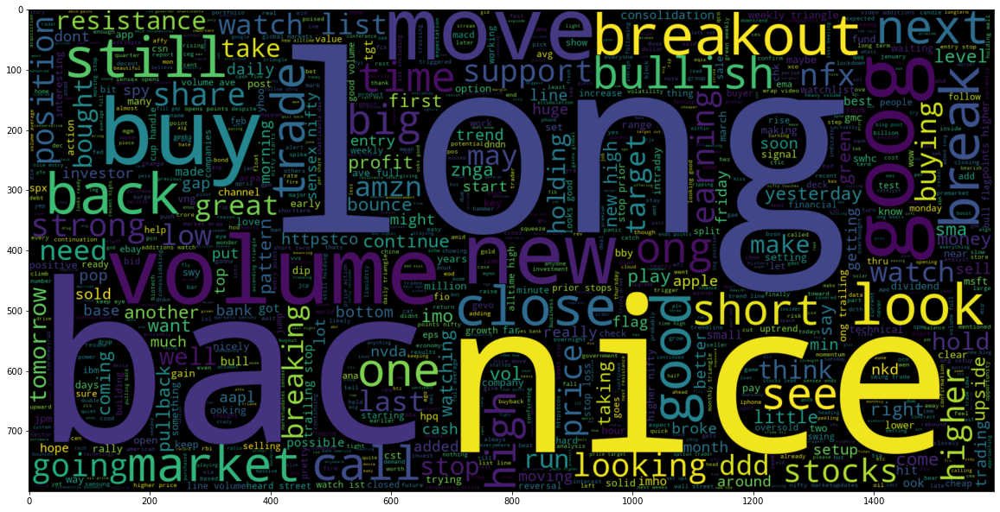

In [93]:
# plot the word cloud for text with positive sentiment
plt.figure(figsize = (20, 20)) 
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800).generate(" ".join(stock_df[stock_df['Sentiment'] == 1]['Text Without Punc & Stopwords Joined']))
plt.imshow(wc, interpolation = 'bilinear');

#### Visualize cleaned datasets:

In [94]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\piyus\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [95]:
# use word_tokenize - to break up a string into words
print(stock_df['Text Without Punc & Stopwords Joined'][0])
print(nltk.word_tokenize(stock_df['Text Without Punc & Stopwords Joined'][0]))

kickers watchlist xide tit soq pnk cpw bpz trade method method see prev posts
['kickers', 'watchlist', 'xide', 'tit', 'soq', 'pnk', 'cpw', 'bpz', 'trade', 'method', 'method', 'see', 'prev', 'posts']


In [96]:
# Obtain the maximum length of data in the document
maxlen = -1
for doc in stock_df['Text Without Punc & Stopwords Joined']:
    tokens = nltk.word_tokenize(doc)
    if(maxlen < len(tokens)):
        maxlen = len(tokens)
print("The maximum number of words in any document is:", maxlen)

The maximum number of words in any document is: 20


In [97]:
tweets_length = [ len(nltk.word_tokenize(x)) for x in stock_df['Text Without Punc & Stopwords Joined'] ]
tweets_length

[14,
 6,
 7,
 1,
 0,
 1,
 8,
 13,
 8,
 4,
 10,
 18,
 8,
 8,
 11,
 5,
 12,
 10,
 12,
 4,
 6,
 5,
 2,
 5,
 3,
 10,
 3,
 3,
 9,
 6,
 8,
 10,
 8,
 3,
 10,
 11,
 4,
 8,
 11,
 10,
 10,
 7,
 9,
 8,
 4,
 10,
 8,
 7,
 7,
 9,
 10,
 10,
 8,
 2,
 14,
 12,
 9,
 8,
 1,
 14,
 7,
 11,
 5,
 13,
 6,
 6,
 7,
 6,
 6,
 10,
 9,
 4,
 10,
 13,
 16,
 6,
 9,
 6,
 2,
 11,
 5,
 4,
 9,
 11,
 16,
 4,
 9,
 5,
 6,
 2,
 1,
 5,
 9,
 4,
 7,
 6,
 7,
 10,
 1,
 3,
 9,
 4,
 16,
 8,
 10,
 11,
 18,
 6,
 7,
 13,
 12,
 9,
 3,
 3,
 10,
 10,
 8,
 6,
 8,
 5,
 5,
 8,
 9,
 15,
 3,
 5,
 9,
 18,
 13,
 11,
 3,
 1,
 1,
 2,
 7,
 12,
 12,
 8,
 8,
 10,
 9,
 10,
 15,
 8,
 9,
 9,
 12,
 10,
 6,
 10,
 13,
 4,
 11,
 8,
 15,
 13,
 8,
 12,
 5,
 5,
 3,
 7,
 2,
 4,
 10,
 5,
 6,
 10,
 6,
 16,
 9,
 6,
 5,
 10,
 9,
 10,
 8,
 2,
 10,
 9,
 10,
 12,
 7,
 10,
 7,
 3,
 6,
 5,
 9,
 9,
 4,
 6,
 5,
 4,
 4,
 8,
 10,
 8,
 8,
 13,
 9,
 7,
 10,
 12,
 8,
 6,
 5,
 3,
 10,
 11,
 6,
 9,
 10,
 13,
 10,
 7,
 12,
 7,
 11,
 10,
 4,
 4,
 3,
 10,
 2,
 9,
 10,
 15,
 12,
 10

#### Plot the distribution for the number of words in a text

In [98]:
fig = px.histogram(x = tweets_length, nbins = 50)
fig.show()

In [99]:
# Obtain the total words present in the dataset
list_of_words = []
for i in stock_df['Text Without Punc & Stopwords']:
    for j in i:
        list_of_words.append(j)

list_of_words

['kickers',
 'watchlist',
 'xide',
 'tit',
 'soq',
 'pnk',
 'cpw',
 'bpz',
 'trade',
 'method',
 'method',
 'see',
 'prev',
 'posts',
 'movie',
 'return',
 'feageed',
 'indicator',
 'trades',
 'awesome',
 'afraid',
 'short',
 'amzn',
 'looking',
 'like',
 'nearmonopoly',
 'ebooks',
 'mnta',
 'pgnx',
 'current',
 'downtrend',
 'break',
 'otherwise',
 'shortterm',
 'correction',
 'medterm',
 'downtrend',
 'mondays',
 'relative',
 'weakness',
 'nyx',
 'win',
 'tie',
 'tap',
 'ice',
 'int',
 'bmc',
 'aon',
 'chk',
 'biib',
 'goog',
 'ower',
 'trend',
 'line',
 'channel',
 'test',
 'volume',
 'support',
 'watch',
 'tomorrow',
 'ong',
 'entry',
 'assuming',
 'fcx',
 'opens',
 'tomorrow',
 'trigger',
 'buy',
 'still',
 'much',
 'like',
 'setup',
 'really',
 'worries',
 'everyone',
 'expects',
 'market',
 'rally',
 'nowusually',
 'exact',
 'opposite',
 'happens',
 'every',
 'time',
 'shall',
 'see',
 'soon',
 'bac',
 'spx',
 'jpm',
 'gamcos',
 'arry',
 'haverty',
 'apple',
 'extremely',
 'chea

In [100]:
# Obtain the total number of unique words
total_words = len(list(set(list_of_words)))
total_words

9268

In [101]:
# split the data into train and test 
X = stock_df['Text Without Punc & Stopwords']
y = stock_df['Sentiment']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)

In [102]:
X_train.shape,X_test.shape

((5211,), (580,))

In [103]:
X_train

1139    [comment, post, guy, target, msft, end, tad, a...
2680                    [weekly, triangle, dvaxopen, ong]
4855            [goog, puts, worked, ceg, calls, options]
3336    [shd, last, time, saw, kmart, sears, full, peo...
3087    [znga, wanna, see, ema, cross, sma, confirmati...
                              ...                        
33                                     [goog, ong, close]
3286              [come, fly, lets, fly, lets, fly, away]
3030    [pphm, damn, sorry, folks, pharms, getting, ta...
2197         [weekly, triangle, hek, closed, net, profit]
3100    [txn, watch, list, back, line, volume, full, a...
Name: Text Without Punc & Stopwords, Length: 5211, dtype: object

In [104]:
# Create a tokenizer to tokenize the words and create sequences of tokenized words
tokenizer = Tokenizer(num_words = total_words)
tokenizer.fit_on_texts(X_train)

# Training data
train_sequences = tokenizer.texts_to_sequences(X_train)

# Testing data
test_sequences = tokenizer.texts_to_sequences(X_test)


In [105]:
train_sequences, test_sequences

([[2486, 171, 1543, 50, 242, 159, 3616, 2487],
  [28, 20, 3617, 22],
  [6, 113, 653, 654, 72, 313],
  [457, 41, 24, 708, 3618, 1544, 87, 289],
  [106, 2488, 18, 190, 390, 123, 709, 88, 26],
  [11, 338, 359, 36, 3619],
  [1545, 34, 339],
  [231, 83, 710, 778, 60, 391, 165, 124, 390],
  [10, 78, 487, 860, 15, 2, 129, 1306, 191, 144],
  [25, 458, 42, 46, 29, 1307, 51, 76, 118, 84, 1308, 62, 3620, 3621, 3622],
  [232, 38, 3623, 3624, 232, 38, 2489, 512, 256, 1309, 1903, 73],
  [44, 3625, 1546],
  [1904, 43, 598, 55, 1905],
  [392, 416, 217, 223, 90, 3626],
  [12, 218, 6, 1906, 2490, 1310, 2491, 1123],
  [101, 51, 599, 393, 711, 779, 513, 514, 2492, 459, 3627, 3628],
  [981, 76, 243, 69, 7, 208, 861],
  [360, 130, 60, 10, 78, 26, 129, 119, 340, 600],
  [1311, 488, 32, 3629, 1547, 3630, 3631, 116, 34, 48, 14, 515, 3632, 3633],
  [63, 712, 601, 862, 3634, 1907, 290],
  [5, 159, 2, 90, 341, 780],
  [107, 394, 1312, 32, 18, 83, 14, 102],
  [40, 314, 314, 1908, 3635, 557, 1909, 209, 558, 863, 71

In [106]:
# Add padding to training and testing
padded_train = pad_sequences(train_sequences, maxlen = 29, padding = 'post', truncating = 'post')
padded_test = pad_sequences(test_sequences, maxlen = 29, truncating = 'post')

for i, doc in enumerate(padded_train[:3]):
     print("The padded encoding for document:", i+1," is:", doc)

# Convert the data to categorical 2D representation
y_train_cat = to_categorical(y_train, 2)
y_test_cat = to_categorical(y_test, 2)

y_train_cat.shape

y_test_cat.shape

y_train_cat

The padded encoding for document: 1  is: [2486  171 1543   50  242  159 3616 2487    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0]
The padded encoding for document: 2  is: [  28   20 3617   22    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0]
The padded encoding for document: 3  is: [  6 113 653 654  72 313   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0]


array([[1., 0.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [1., 0.],
       [0., 1.]], dtype=float32)

In [107]:
# Add padding to training and testing
padded_train = pad_sequences(train_sequences, maxlen = 15, padding = 'post', truncating = 'post')
padded_test = pad_sequences(test_sequences, maxlen = 15, truncating = 'post')

### Building a custom Deep Neurak Network for Sentiment Ananlysis

In [108]:
# Build model (assign parameters)
# Sequential Model
model = Sequential()

# embedding layer
model.add(Embedding(total_words, output_dim = 512))

# Bi-Directional RNN and LSTM
model.add(LSTM(256))

# Dense layers
model.add(Dense(128, activation = 'relu'))
model.add(Dropout(0.3))
model.add(Dense(2,activation = 'softmax'))
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, None, 512)         4745216   
_________________________________________________________________
lstm_3 (LSTM)                (None, 256)               787456    
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 258       
Total params: 5,565,826
Trainable params: 5,565,826
Non-trainable params: 0
_________________________________________________________________


In [109]:
# train the model
model.fit(padded_train, y_train_cat, batch_size = 32, validation_split = 0.2, epochs = 2)

Epoch 1/2
131/131 [==============================] - 10s 74ms/step - loss: 0.5859 - acc: 0.6951 - val_loss: 0.5194 - val_acc: 0.7546
Epoch 2/2
131/131 [==============================] - 9s 72ms/step - loss: 0.3093 - acc: 0.8774 - val_loss: 0.5374 - val_acc: 0.7478


In [110]:
# make prediction
pred = model.predict(padded_test)

# make prediction
prediction = []
for i in pred:
    prediction.append(np.argmax(i))

# list containing original values
original = []
for i in y_test_cat:
    original.append(np.argmax(i))

# acuracy score on text data
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, prediction)
accuracy

0.7844827586206896

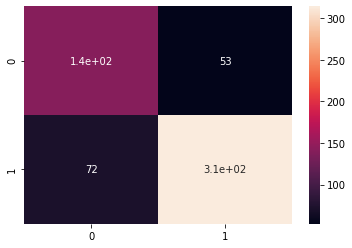

In [111]:
# Plot the confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(original, prediction)
sns.heatmap(cm, annot = True)